# DEL Minichallenge - Dog Breed Classification 

![Happy Dogs](pics/happy_dogs.png)

##  Introduction

This mini-challenge is part of the Deep Learning (DEL) module in the Data Science program. The goal of the challenge is to implement, train, and evaluate several neural network models for a classification task, and to gain hands-on experience with core deep learning concepts such as hyperparameter tuning, model evaluation, and performance analysis.

For this purpose, I chose the Stanford Dogs Dataset, a subset of the large-scale ImageNet dataset. It consists of over 20,000 high-quality color images of dogs, covering 120 different breeds from around the world. Each image is labeled with its corresponding breed, allowing for a supervised classification task. The dataset presents a realistic challenge for convolutional neural networks (CNNs), as it combines high intra-class variability (dogs of the same breed in different poses, lighting, or environments) with inter-class similarity (breeds that look visually similar).

The dataset structure is well-suited for this project because it:  

•	Provides clear class labels and a moderate total size, enabling fast experimentation on a standard GPU or CPU.  
•	Focuses on image classification, which aligns directly with the learning objectives of the mini-challenge.  
•	Allows systematic exploration of model design, training behavior, and regularization techniques without excessive preprocessing effort.  

**Project Structure**

The project is divided into two main stages:

1.	Baseline Model Development (Stage 1)

•	Explore and preprocess the dataset.  
•	Implement a baseline CNN architecture with a few convolutional and fully connected layers.  
•	Train the model using stochastic gradient descent (SGD) without momentum, regularization, or batch normalization.   
•	Tune the learning rate and batch size manually, and analyze their effect on training behavior and performance metrics such as accuracy and loss.  

2.	Model Improvement and Hyperparameter Tuning (Stage 2)

•	Formulate and test hypotheses about the impact of various hyperparameters and architectural choices, such as model depth, width, kernel size, dropout, and optimizer type.  
•	Evaluate and compare models using validation and test sets.  
•	Apply experiment tracking tools (e.g., Weights & Biases) to visualize and monitor the training process.  
•	Build a final “best model” by combining the most effective techniques.

Throughout the mini-challenge, I aim to deepen my understanding of CNN training dynamics and systematically investigate how hyperparameter choices influence convergence, generalization, and overall model performance.

### Imports

In [67]:
import os
import tarfile
import importlib
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np
import optuna
import requests
import scipy
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset, TensorDataset, random_split
try:
    from torch.utils.tensorboard import SummaryWriter  # type: ignore
    TENSORBOARD_AVAILABLE = True
except ModuleNotFoundError:  # pragma: no cover - graceful fallback
    TENSORBOARD_AVAILABLE = False

    class SummaryWriter:  # type: ignore
        """No-op SummaryWriter used when tensorboard is unavailable."""

        def __init__(self, *_, **__):
            print(
                "TensorBoard is not installed. Install it with `pip install tensorboard` "
                "to enable logging. Falling back to a no-op writer."
            )

        def add_scalar(self, *_, **__):
            return None

        def close(self):
            return None
from torchvision import transforms

import helper_utils

importlib.reload(helper_utils)


<module 'helper_utils' from '/Users/stefanbinkert/Documents/FHNW_DS/DEL/DEL_DOGS/helper_utils.py'>

In [68]:
# Prefer CUDA, then Apple Metal (MPS), falling back to CPU.
if torch.cuda.is_available():
    device = torch.device('cuda')
elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print('Using device:', device)

Using device: mps


### Data Structure

This snippet sets up and inspects the dataset structure. It defines the path to the root image dataset and then prints the folder hierarchy up to one level deep — giving an overview of how the image data is organized.

In [69]:
# Define the path to the root directory of the dataset.
path_dataset = 'data/raw/Images'

# Display the folder structure of the dataset directory up to a depth of one.
helper_utils.print_data_folder_structure(path_dataset, max_depth=1)

Images/
├── n02085620-Chihuahua/
├── n02085782-Japanese_spaniel/
├── n02085936-Maltese_dog/
├── n02086079-Pekinese/
├── n02086240-Shih-Tzu/
├── n02086646-Blenheim_spaniel/
├── n02086910-papillon/
├── n02087046-toy_terrier/
├── n02087394-Rhodesian_ridgeback/
├── n02088094-Afghan_hound/
├── n02088238-basset/
├── n02088364-beagle/
├── n02088466-bloodhound/
├── n02088632-bluetick/
├── n02089078-black-and-tan_coonhound/
├── n02089867-Walker_hound/
├── n02089973-English_foxhound/
├── n02090379-redbone/
├── n02090622-borzoi/
├── n02090721-Irish_wolfhound/
├── n02091032-Italian_greyhound/
├── n02091134-whippet/
├── n02091244-Ibizan_hound/
├── n02091467-Norwegian_elkhound/
├── n02091635-otterhound/
├── n02091831-Saluki/
├── n02092002-Scottish_deerhound/
├── n02092339-Weimaraner/
├── n02093256-Staffordshire_bullterrier/
├── n02093428-American_Staffordshire_terrier/
├── n02093647-Bedlington_terrier/
├── n02093754-Border_terrier/
├── n02093859-Kerry_blue_terrier/
├── n02093991-Irish_terrier/
├── n

### Dataset

The DogDataset class is a custom implementation of PyTorch’s Dataset base class designed to load images from the Stanford Dogs directory structure, where each subfolder corresponds to a different dog breed.

When initialized, the class:

•	Scans all subdirectories under the given root directory (data/raw/Images by default) to find images and assigns each breed an integer label.  
•	Stores image file paths and their corresponding labels in memory.  
•	Implements the required methods __len__() and __getitem__() so that it can be used seamlessly with PyTorch’s DataLoader.

During training, the DataLoader calls __getitem__() to:

•	Load an image from disk using PIL,  
•	Apply optional preprocessing or data augmentation transforms,  
•	Return a tuple (image_tensor, label) for each sample.

This structure allows efficient batching, shuffling, and transformation of image data directly inside the PyTorch training loop.

In [70]:
class DogDataset(Dataset):
    """
    A custom dataset class for loading dog image data from the Stanford Dogs structure.

    The loader indexes every image under ``data/raw/Images`` (or a user-supplied
    directory) so the samples can be consumed directly by PyTorch ``DataLoader``
    instances.
    """

    def __init__(self, root_dir=None, transform=None):
        """
        Initialize the dataset and build the label/index metadata.

        Args:
            root_dir (str | Path | None): Optional path to the dataset root. When
                omitted the helper searches ``data/raw/Images`` relative to the repository.
            transform (callable | None): Optional transform applied to every image before
                it is returned.

        Returns:
            None
        """
        # Store the optional transformations so __getitem__ can apply them later.
        self.transform = transform
        # Resolve the dataset location and cache label mapping information.
        self.root_dir = helper_utils.resolve_images_root(root_dir)
        self.image_dir = self.root_dir
        self.labels = self.load_and_correct_labels()

    def __len__(self):
        """
        Return the total number of discovered samples.

        Returns:
            int: Number of indexed image files.
        """
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Retrieve a processed sample from the dataset.

        Args:
            idx (int): Index of the desired sample.

        Returns:
            tuple[torch.Tensor, int]: Transformed image tensor and its label.
        """
        image = self.retrieve_image(idx)
        if self.transform is not None:
            image = self.transform(image)
        label = self.labels[idx]
        return image, label

    def value_counts(self):
        """
        Return the number of samples per label.

        Returns:
            collections.Counter: Mapping between label id and frequency.
        """
        return Counter(self.labels)

    def retrieve_image(self, idx):
        """
        Load a single image from disk and convert it to RGB.

        Args:
            idx (int): Index of the sample to load.

        Returns:
            PIL.Image.Image: Loaded RGB image.
        """
        img_path = self.image_paths[idx]
        with Image.open(img_path) as img:
            image = img.convert("RGB")
        return image

    def load_and_correct_labels(self):
        """
        Index all image files and assign zero-indexed integer labels per breed.

        Returns:
            list[int]: Label array aligned with ``self.image_paths``.
        """
        class_dirs = [
            entry
            for entry in os.listdir(self.image_dir)
            if os.path.isdir(os.path.join(self.image_dir, entry))
        ]
        if not class_dirs:
            raise ValueError(f"No class folders found in {self.image_dir}.")

        class_dirs.sort()
        self.class_names = class_dirs
        self.class_to_idx = {name: idx for idx, name in enumerate(self.class_names)}
        self.idx_to_class = {idx: name for name, idx in self.class_to_idx.items()}

        image_paths = []
        labels = []
        valid_extensions = (".jpg", ".jpeg", ".png")

        for class_name in self.class_names:
            class_path = os.path.join(self.image_dir, class_name)
            for file_name in sorted(os.listdir(class_path)):
                if file_name.lower().endswith(valid_extensions):
                    image_paths.append(os.path.join(class_path, file_name))
                    labels.append(self.class_to_idx[class_name])

        if not image_paths:
            raise ValueError(f"No image files found under {self.image_dir}.")

        self.image_paths = image_paths
        return labels

    def get_label_description(self, label):
        """
        Retrieve the human-readable breed name for a given label index.

        Args:
            label (int): Integer label assigned to a sample.

        Returns:
            str: Normalized breed name without the WordNet id prefix.
        """
        raw_name = self.idx_to_class[label]
        if '-' in raw_name:
            raw_name = raw_name.split('-', 1)[1]
        return raw_name.lower()



In [71]:
# Initialize the dataset object, show the number of samples
dog_dataset = DogDataset()
num_samples = len(dog_dataset)
print(f"Number of samples in dataset: {num_samples}")


Number of samples in dataset: 20580


In [72]:
# Define an index for a sample to retrieve.
sel_idx = 888

# Retrieve the image and label for the selected index.
img, label = dog_dataset[sel_idx]

# Create a string detailing the image's dimensions.
img_size_info = f"Image size: {img.size}"

# Print the image size information along with its corresponding label.
print(f'{img_size_info}, Label: {label}\n')

Image size: (500, 475), Label: 4



The size is a bit large, we will resize it later.

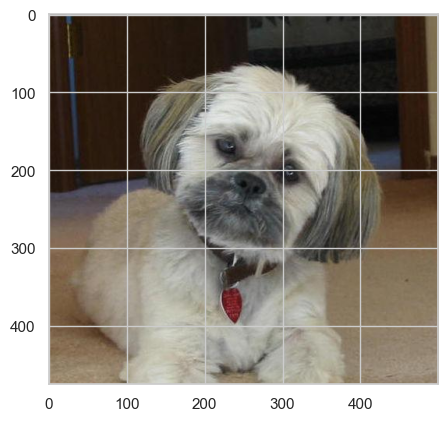

In [73]:
# Visualize a sample
plt.imshow(np.array(img))

Let's inspect the labels in the dataset. For each unique label, print its corresponding description using the `get_label_description` method.

In [74]:
# Get all labels from the dataset object.
dataset_labels = dog_dataset.labels

# Create a set of unique labels to remove duplicates.
unique_labels = set(dataset_labels)

# Iterate through each unique label.
for label in unique_labels:
    # Print the numerical label and its corresponding text description.
    print(f'Label: {label}, Description: {dog_dataset.get_label_description(label)}')

Label: 0, Description: chihuahua
Label: 1, Description: japanese_spaniel
Label: 2, Description: maltese_dog
Label: 3, Description: pekinese
Label: 4, Description: shih-tzu
Label: 5, Description: blenheim_spaniel
Label: 6, Description: papillon
Label: 7, Description: toy_terrier
Label: 8, Description: rhodesian_ridgeback
Label: 9, Description: afghan_hound
Label: 10, Description: basset
Label: 11, Description: beagle
Label: 12, Description: bloodhound
Label: 13, Description: bluetick
Label: 14, Description: black-and-tan_coonhound
Label: 15, Description: walker_hound
Label: 16, Description: english_foxhound
Label: 17, Description: redbone
Label: 18, Description: borzoi
Label: 19, Description: irish_wolfhound
Label: 20, Description: italian_greyhound
Label: 21, Description: whippet
Label: 22, Description: ibizan_hound
Label: 23, Description: norwegian_elkhound
Label: 24, Description: otterhound
Label: 25, Description: saluki
Label: 26, Description: scottish_deerhound
Label: 27, Descripti

### Overview of the different Dog breeds

Let's check out the different breed classes and the samples per class.


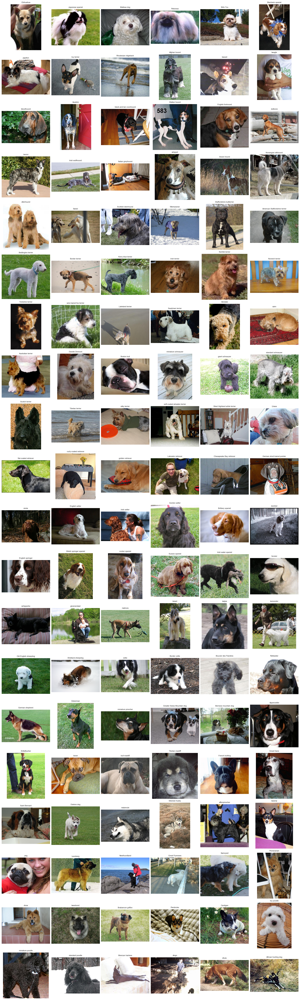

In [75]:
# Plot overview
helper_utils.plot_group_overview_grid()

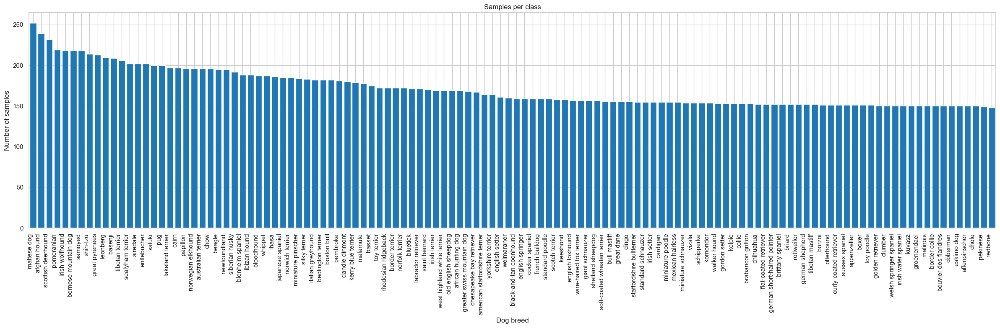

In [76]:
# Visualize sample counts per breed
helper_utils.plot_class_distribution(dog_dataset)

### Transformations

Before feeding images into a neural network, they must be preprocessed through a series of transformations to ensure consistent input and stable training. These preprocessing steps typically include resizing the images to a uniform size, converting them into tensors, and normalizing their pixel values to a common scale.

**Computing Mean and Standard Deviation**

To correctly normalize the dataset, it is necessary to compute the mean and standard deviation of all training images after resizing and converting them to tensors. This ensures that normalization reflects the true pixel distribution used during training.

The auxiliary function get_mean_std performs this calculation by:

•	Preprocessing Setup: Defining a transform pipeline that resizes images (e.g., to 128×128 pixels) and converts them into PyTorch tensors.  
•	Per-Image Processing: Iterating through each image, applying the transform, and computing per-channel mean and standard deviation across spatial dimensions.  
•	Statistics Collection: Storing the results for each image in lists of means and standard deviations.  
•	Global Calculation: Combining all per-image statistics and averaging them to obtain dataset-wide channel means and standard deviations.

We will compute the values after the train split is created to avoid data leakage.
These computed values are later used in the normalization transform, ensuring that all input images are scaled consistently across the dataset.

**Defining Transformations**

After computing the dataset’s mean and standard deviation, the next step is to define the image transformations that will be applied before training. These transformations prepare the data for the neural network and help improve model generalization.

Two separate transformation pipelines are created:

•	A training pipeline, which includes data augmentation to increase the diversity of the training samples.  
•	A validation and test pipeline, which uses only the basic preprocessing steps to ensure consistent evaluation.

The main transforms include resizing the images to a fixed size (e.g., 128×128 pixels), converting them to tensors, and normalizing them with the computed mean and standard deviation.  

The augmentation transforms add random variations, such as horizontal flips (with 50% probability) and small random rotations (±15°), to make the model more robust to changes in image orientation and composition.

Finally, both sets of transforms are composed into complete pipelines using transforms.Compose. This ensures that every image is preprocessed in the same consistent way before being passed to the neural network.

### Data Loading

Once the custom dataset and transformations are defined, the next step is to prepare the data for efficient training and evaluation. In PyTorch, this is handled using DataLoaders, which automate batching, shuffling, and parallel data loading.

Before creating DataLoaders, the dataset is typically divided into three subsets:

•	Training set – used by the model to learn patterns and update its weights.  
•	Validation set – used to tune hyperparameters and monitor overfitting during training.  
•	Test set – used only at the end to evaluate the model’s final performance on unseen data.

The split can be done with torch.utils.data.random_split, which partitions the dataset according to specified ratios. It is important to apply data augmentation only to the training set, while keeping the validation and test sets unchanged to ensure fair performance evaluation.

When splitting a dataset with torch.utils.data.random_split, each resulting subset (train, validation, test) still references the same original dataset — including its transform.
This means you cannot assign different transformations (e.g., data augmentation only for training) directly to each subset.

The SubsetWithTransform class solves this problem by wrapping each subset and allowing a separate transform to be applied. This makes it possible to use augmentation on the training set while keeping the validation and test sets unchanged for fair evaluation.

After splitting, DataLoaders are created for each subset using torch.utils.data.DataLoader. Key parameters include:

•	dataset: the dataset or subset to load from,  
•	batch_size: how many samples are combined into one batch,  
•	shuffle: whether to randomize the order of samples (enabled for training, disabled for validation and test).

DataLoaders streamline the entire data-serving process, ensuring that batches are efficiently fed to the model during each epoch and that every training run remains reproducible and well-structured.


In [77]:
# Class to wrap each subset
class SubsetWithTransform(Dataset):
    """A subset wrapper that lets you apply a specific transform per split."""

    def __init__(self, subset: Subset, transform=None):
        """
        Store a reference to the subset and the transform to apply.

        Args:
            subset (Subset): Underlying subset returned by ``random_split``.
            transform (callable | None): Transform applied inside ``__getitem__``.

        Returns:
            None
        """
        self.subset = subset  # subset WITHOUT transform
        self.transform = transform

    def __len__(self):
        """
        Return the number of samples in the wrapped subset.

        Returns:
            int: Length of ``subset``.
        """
        return len(self.subset)

    def __getitem__(self, idx):
        """
        Fetch an item from the subset and apply the configured transform.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            tuple[torch.Tensor, int]: (image, label) pair with transforms applied.
        """
        image, label = self.subset[idx]
        if self.transform is not None:
            image = self.transform(image)
        return image, label


# Split full dataset into train / val / test 
full_dataset = dog_dataset

val_fraction  = 0.15
test_fraction = 0.15
batch_size    = 64

total_size = len(full_dataset)
val_size   = int(total_size * val_fraction)
test_size  = int(total_size * test_fraction)
train_size = total_size - val_size - test_size

train_subset, val_subset, test_subset = random_split(
    full_dataset, [train_size, val_size, test_size]
)

# Get mean and std from the train dataset for later use in Normalize()
# mean, std = helper_utils.get_mean_std(train_subset)

# Hardcoded mean and std to skip recomputation
mean = torch.tensor([0.4760, 0.4521, 0.3909])
std = torch.tensor([0.2544, 0.2488, 0.2536])
print(f"Mean: {mean}, Std: {std}\n")





Mean: tensor([0.4760, 0.4521, 0.3909]), Std: tensor([0.2544, 0.2488, 0.2536])



In [78]:
# Get transformations
main_tfs = [  
    # Resize images to 128x128 pixels
    transforms.Resize(128),
    # Centercrop
    transforms.CenterCrop(128),
    # Convert images to PyTorch tensors
    transforms.ToTensor(),
    # Normalize images using the provided mean and std
    transforms.Normalize(mean, std)
]  

augmentation_tfs = [  
    # Randomly flip the image vertically
    transforms.RandomHorizontalFlip(p=0.5),
    # Randomly rotate the image by ±15 degrees
    transforms.RandomRotation(degrees=15)
]  

# Compose the main transformations into a single pipeline
main_transform = transforms.Compose(main_tfs)
transform_with_augmentation = transforms.Compose(augmentation_tfs+main_tfs)

In [ ]:
# Wrap subsets with the correct transforms 
trainset_with_aug       = SubsetWithTransform(train_subset, transform_with_augmentation)
trainset                = SubsetWithTransform(train_subset, main_transform)
validationset           = SubsetWithTransform(val_subset,   main_transform)
testset                 = SubsetWithTransform(test_subset,  main_transform)

# Create dataloaders 
trainloader_with_aug      = DataLoader(trainset_with_aug, batch_size=batch_size, shuffle=True)
trainloader               = DataLoader(trainset,      batch_size=batch_size, shuffle=True)
validationloader          = DataLoader(validationset, batch_size=512, shuffle=False)
testloader                = DataLoader(testset,       batch_size=512, shuffle=False)

# Quick sanity checks
print("Train samples:", len(trainset), "  batches:", len(trainloader))
print("Val   samples:", len(validationset), "  batches:", len(validationloader))
print("Test  samples:", len(testset), "  batches:", len(testloader))

Train samples: 14406   batches: 226
Val   samples: 3087   batches: 49
Test  samples: 3087   batches: 49


## Metric for Evaluation

For the Stanford Dogs classification task, **accuracy** is an appropriate evaluation metric because the goal is to correctly assign each image to one of many mutually exclusive dog breeds. Each image has exactly one correct label, and all classes are equally relevant — there is no class that is more important than another.

In such a balanced, multi-class classification setting, accuracy provides a clear and intuitive measure of overall model performance by simply indicating the proportion of correctly classified images. More complex metrics (such as precision, recall, or F1-score) are mainly beneficial for imbalanced or multi-label problems, which is not the case here.

Therefore, accuracy effectively reflects how well the CNN learns to distinguish between different dog breeds and serves as a straightforward benchmark for comparing different model variants and hyperparameter settings.

## Baseline Model

The baseline CNN is a straightforward convolutional neural network that serves as a starting point for experimentation.  
It consists of 3 convolutional layers for feature extraction, each followed by ReLU activations and pooling, and 2 fully connected layers for classification.  
This simple yet effective architecture provides a reference for later comparisons with more advanced variants (e.g. deeper networks, dropout, batch normalization, or data augmentation).


In [80]:
class BasicCNN(nn.Module):
    """
    A baseline CNN for 3×128×128 dog images using conv–ReLU–pool blocks.

    Args:
        num_classes (int): Number of output classes produced by the classifier.
    """

    def __init__(self, num_classes: int = 120):
        """
        Build the convolutional feature extractor and classifier head.

        Args:
            num_classes (int): Number of dog breeds to predict.

        Returns:
            None
        """
        super().__init__()

        # Feature extraction blocks capture increasingly abstract patterns.
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU(inplace=True)

        # For 128×128 input: after 3 pooling layers -> 128 → 64 → 32 → 16.
        self.flatten_dim = 128 * 16 * 16

        # Classification head converts flattened features to logits.
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(self.flatten_dim, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Run the forward pass through the CNN.

        Args:
            x (torch.Tensor): Batch of images shaped ``(N, 3, 128, 128)``.

        Returns:
            torch.Tensor: Logits of shape ``(N, num_classes)``.
        """
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        return self.fc2(x)



### Overfitting Test

Before training a model on the full dataset, it’s good practice to perform an overfitting test to verify that the training loop, loss function, and optimizer work correctly.

In this test, the model is trained on a single batch of data for multiple epochs.
If everything is implemented properly, the model should be able to quickly reach near-perfect accuracy on that small batch — essentially memorizing it.

If the model fails to overfit this single batch, it usually indicates a problem in the training setup (such as incorrect gradients, loss calculation, or data flow).
Passing this test confirms that the training process is functioning as expected before moving on to full dataset training.

In [81]:
# Overfitting test on a single batch to validate the training loop
overfit_epochs = 100
# Grab a deterministic batch so each epoch (and rerun) sees the very same data.
trainloader_overfit = DataLoader(trainset, batch_size=batch_size, shuffle=False)
batch_inputs, batch_targets = next(iter(trainloader_overfit))
single_dataset = TensorDataset(batch_inputs.clone(), batch_targets.clone())
single_loader = DataLoader(single_dataset, batch_size=batch_inputs.size(0))

overfit_model = BasicCNN().to(device)
overfit_optimizer = optim.SGD(overfit_model.parameters(), lr=0.01)
loss_fcn = nn.CrossEntropyLoss()

writer = SummaryWriter(log_dir="runs/overfit")

overfit_history = helper_utils.train_model(
    model=overfit_model,
    optimizer=overfit_optimizer,
    train_dataloader=single_loader,
    n_epochs=overfit_epochs,
    loss_fcn=loss_fcn,
    device=device,
    val_dataloader=single_loader,
    writer=writer,
)
final_overfit = overfit_history[-1]
writer.add_hparams(
    {
        "optimizer": "SGD",
        "learning_rate": 0.01,
        "epochs": overfit_epochs,
        "batch_size": batch_inputs.size(0),
    },
    {
        "train_accuracy": final_overfit["train_accuracy"],
        "val_accuracy": final_overfit["val_accuracy"],
    },
)
writer.close()

print(
    f"Overfit run final accuracy: {final_overfit['train_accuracy']:.3%} "
    f"(val {final_overfit['val_accuracy']:.3%})"
)



Overfit run final accuracy: 100.000% (val 100.000%)


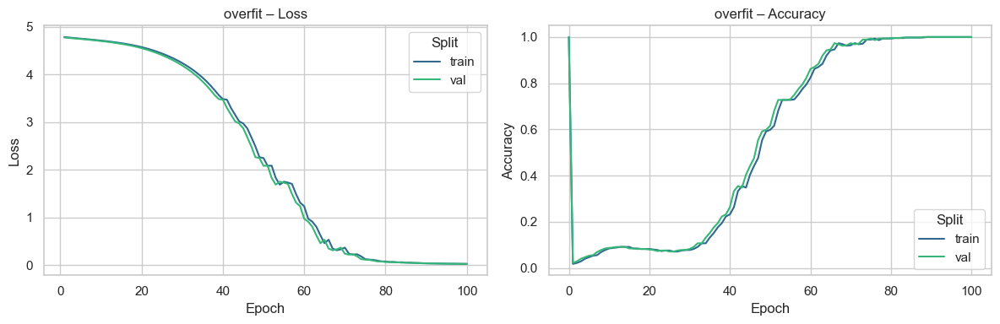

In [82]:
helper_utils.plot_learning_curves("overfit")     # uses logs from "runs/overfit"

The overfitting test achieved 100% training accuracy on a single batch, confirming that the training loop, loss function, and optimizer are working correctly.   
Because the validation set is identical to the training data, both curves (train and val) overlap almost exactly.  
This means the model can successfully memorize a small subset of data, which indicates that gradient updates are applied as expected and the learning process functions properly.  
With this validation, it’s safe to proceed to full training on the complete dataset.

### Baseline training setup

In this step, we train a the BasicCNN on the full training set using stochastic gradient descent (SGD) as optimizer. The model is trained for 10 epochs with a learning rate of 0.01 and evaluated on a separate validation set after each epoch.

During training, loss and accuracy metrics are logged to TensorBoard for both training and validation, allowing us to monitor learning progress. Finally, the overall training and validation accuracy after the last epoch are printed and stored as baseline results for later comparison.

In [83]:
# Train the baseline model on the full training set with plain SGD
baseline_epochs = 10
baseline_model = BasicCNN().to(device)
baseline_optimizer = optim.SGD(baseline_model.parameters(), lr=0.01)
loss_fcn = nn.CrossEntropyLoss()
baseline_writer = SummaryWriter(log_dir="runs/baseline")

baseline_history = helper_utils.train_model(
    model=baseline_model,
    optimizer=baseline_optimizer,
    train_dataloader=trainloader,
    n_epochs=baseline_epochs,
    loss_fcn=loss_fcn,
    device=device,
    val_dataloader=validationloader,
    writer=baseline_writer,
)
val_loss, val_acc = helper_utils.validate_epoch(
    baseline_model, validationloader, loss_fcn, device
)

baseline_writer.add_hparams(
    {
        "optimizer": "SGD",
        "learning_rate": 0.01,
        "epochs": baseline_epochs,
        "batch_size": batch_size,
    },
    {
        "train_accuracy": baseline_history[-1]["train_accuracy"],
        "val_accuracy": baseline_history[-1]["val_accuracy"],
    },
)
baseline_writer.close()

final_baseline = baseline_history[-1]
print(
    "Baseline training finished:",
    f" train acc {final_baseline['train_accuracy']:.3%},",
    f" val acc {final_baseline['val_accuracy']:.3%},",
)



Baseline training finished:  train acc 12.897%,  val acc 3.272%,


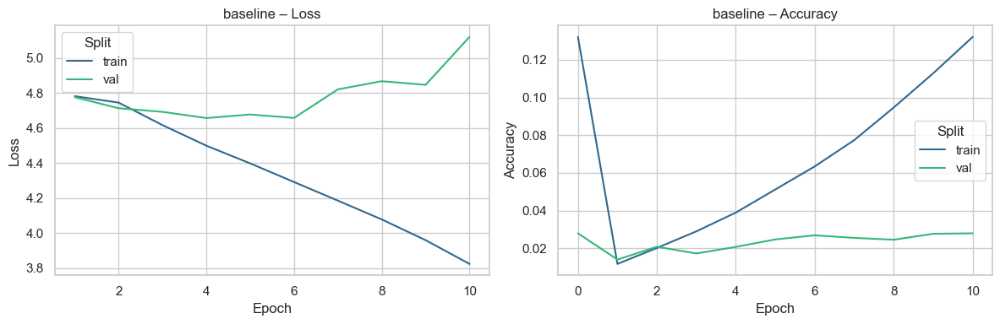

In [84]:
helper_utils.plot_learning_curves("baseline")

The baseline model shows that it has started to learn from the training data, but it’s still far from performing well. The training loss decreases steadily, and the training accuracy slowly increases, which means the model is fitting the training set. However, the validation loss stays high and even rises slightly, while the validation accuracy remains almost flat at around 2–3%.

## Learning-Rate and Batch-Size Grid Search

To quantify how the optimiser step size and the amount of gradient averaging interact, I swept a compact grid over three learning rates (0.001, 0.003, 0.01) and two batch sizes (32, 64). Each configuration reuses the BasicCNN architecture, the same cross-entropy loss, and the augmented training subset. Models train for 10 epochs just to expose relative trends while keeping runtime reasonable. Metrics are logged to TensorBoard and cached locally so they can be plotted side-by-side afterwards.

In [ ]:
import pandas as pd
from itertools import product

os.makedirs(os.path.join("runs", "grid"), exist_ok=True)

grid_learning_rates = [0.001, 0.003, 0.01]
grid_batch_sizes = [32, 64]
grid_epochs = 10
loss_fcn = nn.CrossEntropyLoss()

grid_runs = []
grid_summary_rows = []

for lr, bs in product(grid_learning_rates, grid_batch_sizes):
    run_label = f"lr={lr:.3g} | bs={bs}"
    print(f"Training {run_label}")

    model = BasicCNN().to(device)
    optimizer = optim.SGD(model.parameters(), lr=lr)
    train_loader = DataLoader(trainset, batch_size=bs, shuffle=True)

    log_dir = os.path.join("runs", "grid", f"lr_{str(lr).replace('.', 'p')}_bs_{bs}")
    writer = SummaryWriter(log_dir=log_dir)

    history = helper_utils.train_model(
        model=model,
        optimizer=optimizer,
        train_dataloader=train_loader,
        n_epochs=grid_epochs,
        loss_fcn=loss_fcn,
        device=device,
        val_dataloader=validationloader,
        writer=writer,
    )
    writer.close()

    final_metrics = history[-1]
    print(
        f"  final train acc: {final_metrics['train_accuracy']:.3%} | "
        f"val acc: {final_metrics['val_accuracy']:.3%}"
    )

    grid_runs.append(
        {
            "label": run_label,
            "learning_rate": lr,
            "batch_size": bs,
            "history": history,
        }
    )
    grid_summary_rows.append(
        {
            "label": run_label,
            "learning_rate": lr,
            "batch_size": bs,
            "val_accuracy": final_metrics["val_accuracy"],
            "val_loss": final_metrics["val_loss"],
            "train_accuracy": final_metrics["train_accuracy"],
            "train_loss": final_metrics["train_loss"],
        }
    )

grid_summary = pd.DataFrame(grid_summary_rows).sort_values(
    "val_accuracy", ascending=False
).reset_index(drop=True)
grid_summary

Training lr=0.001 | bs=32
  final train acc: 2.423% | val acc: 1.911%
Training lr=0.001 | bs=64
  final train acc: 1.576% | val acc: 1.296%
Training lr=0.003 | bs=32
  final train acc: 6.352% | val acc: 4.535%
Training lr=0.003 | bs=64
  final train acc: 4.526% | val acc: 2.397%
Training lr=0.01 | bs=32
  final train acc: 11.641% | val acc: 6.803%
Training lr=0.01 | bs=64
  final train acc: 7.795% | val acc: 4.859%


,label,learning_rate,batch_size,val_accuracy,val_loss,train_accuracy,train_loss
0,lr=0.01 | bs=32,0.010,32,0.068027,4.209039,0.116410,3.908960
1,lr=0.01 | bs=64,0.010,64,0.048591,4.400137,0.077954,4.151754
2,lr=0.003 | bs=32,0.003,32,0.045351,4.383409,0.063515,4.273542
3,lr=0.003 | bs=64,0.003,64,0.023971,4.581090,0.045259,4.467591
4,lr=0.001 | bs=32,0.001,32,0.019112,4.702933,0.024226,4.702568
5,lr=0.001 | bs=64,0.001,64,0.012958,4.772541,0.015757,4.767270


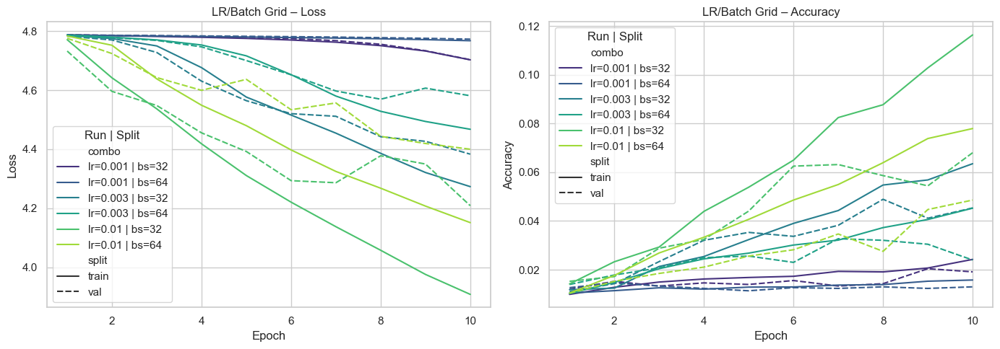

In [86]:
import pandas as pd
import seaborn as sns

if "grid_runs" not in globals() or not grid_runs:
    raise RuntimeError("Run the grid search cell above to populate `grid_runs`.")

grid_plot_df = helper_utils.build_grid_frame(grid_runs)
combo_order = sorted(grid_plot_df["combo"].unique())
palette = dict(zip(combo_order, sns.color_palette("viridis", len(combo_order))))
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for metric, ax, ylabel in [
    ("loss", axes[0], "Loss"),
    ("accuracy", axes[1], "Accuracy"),
]:
    metric_df = grid_plot_df[grid_plot_df["metric"] == metric]
    sns.lineplot(
        data=metric_df,
        x="epoch",
        y="value",
        hue="combo",
        style="split",
        hue_order=combo_order,
        palette=palette,
        ax=ax,
    )
    ax.set_title(f"LR/Batch Grid – {ylabel}")
    ax.set_xlabel("Epoch")
    ax.set_ylabel(ylabel)
    ax.legend(title="Run | Split")

plt.tight_layout()
plt.show()

In [87]:
torch.backends.mps.is_built()

True

In [88]:
os.cpu_count()

14